<a href="https://colab.research.google.com/github/AndrewThanatos/Facial_Keypoints_Detection/blob/main/Keypoints_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This is keypoints detection project. Input is a color image of size (224, 224) and as output are 48 keypoints of the face. Main focus was to find correct keypoints even if person wearing glasses or head is titled.![result_4.png](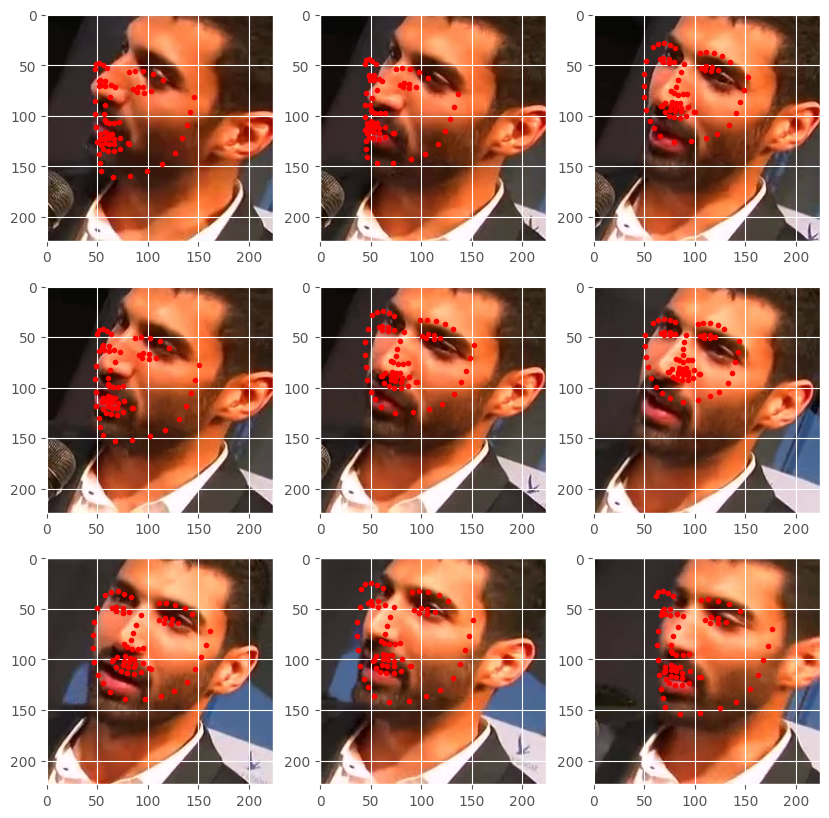![result_1.png](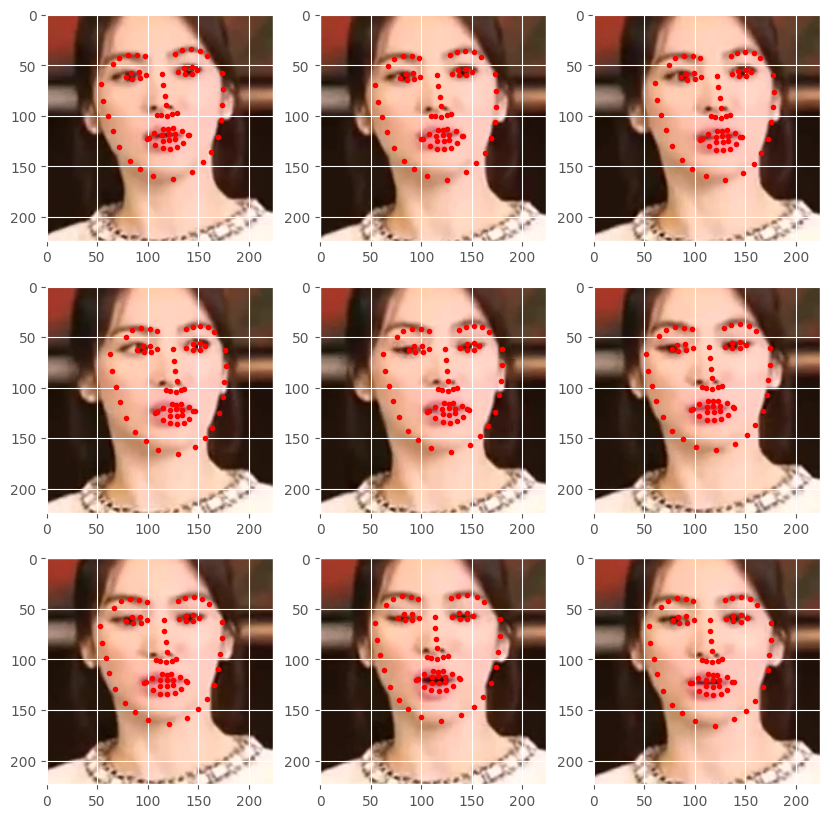![1.png](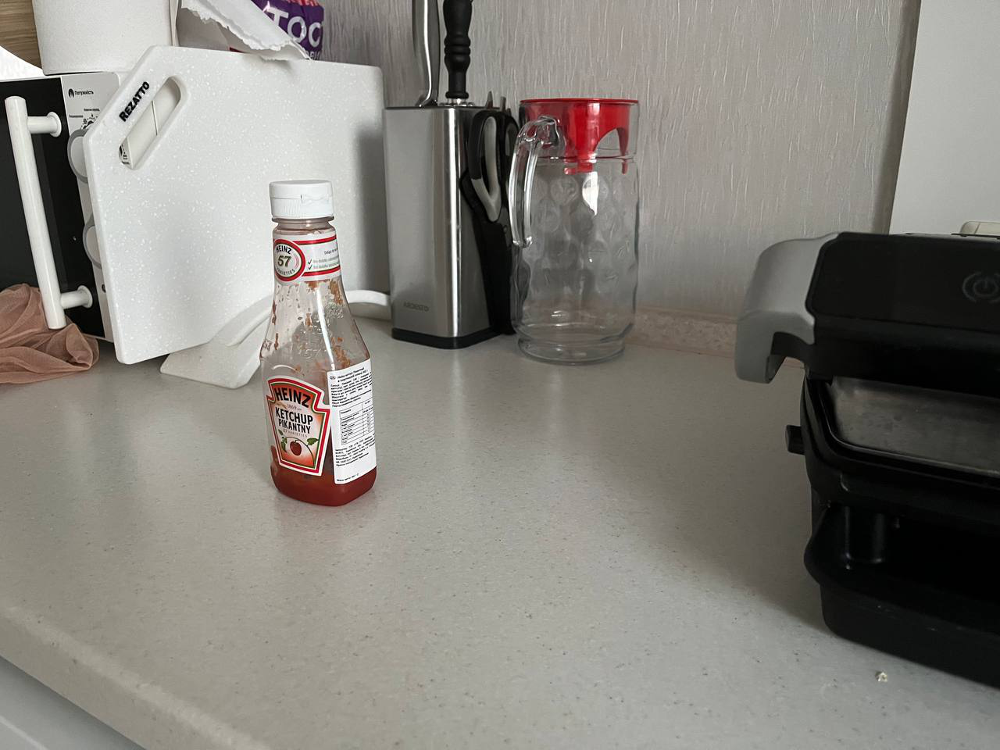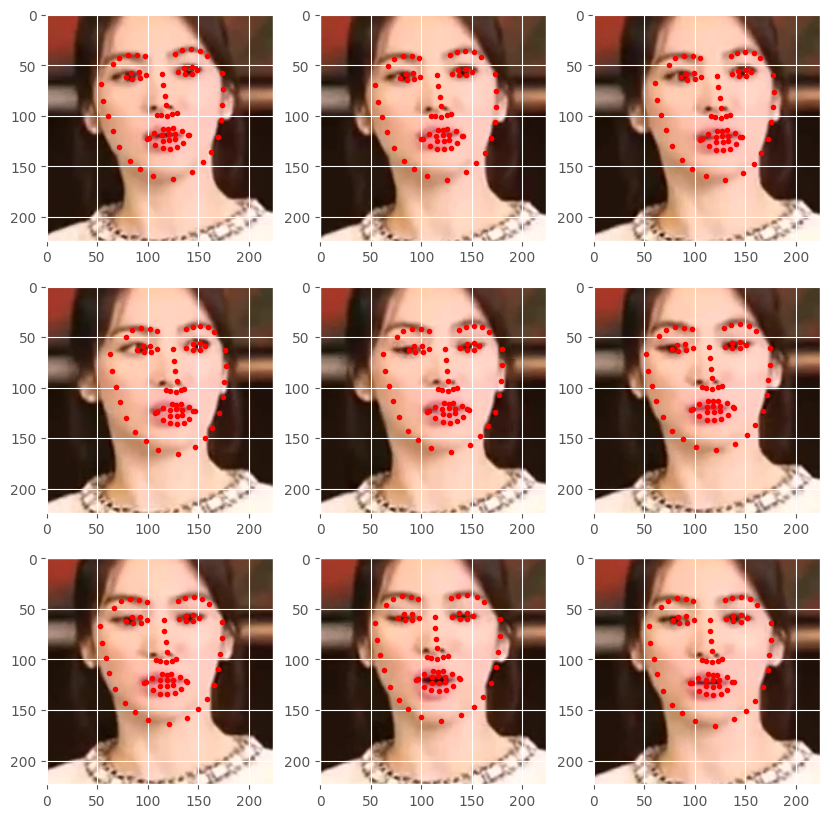)))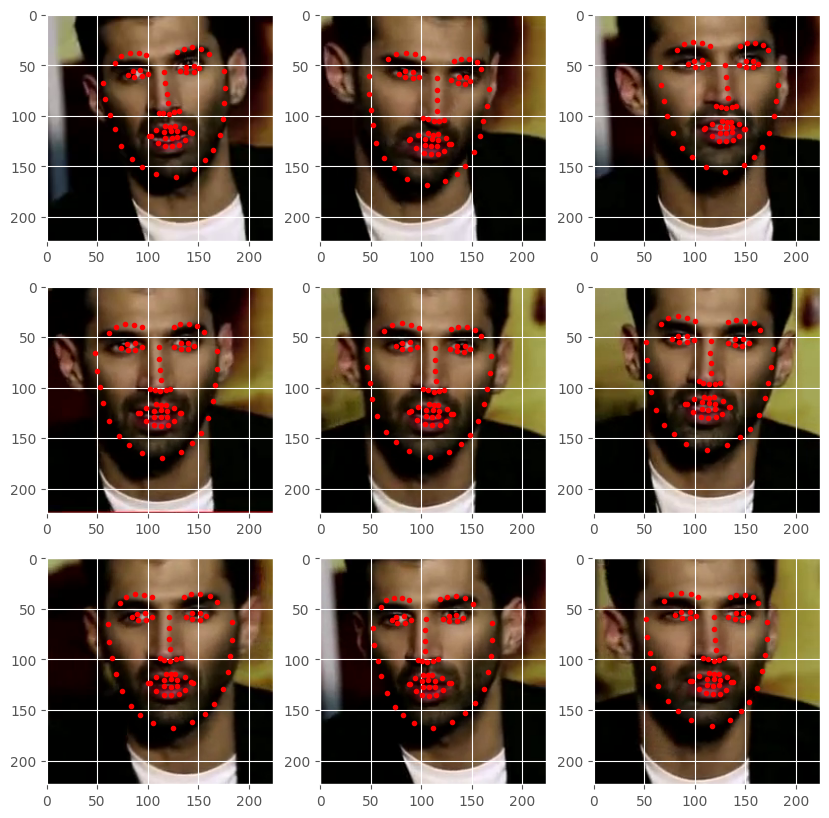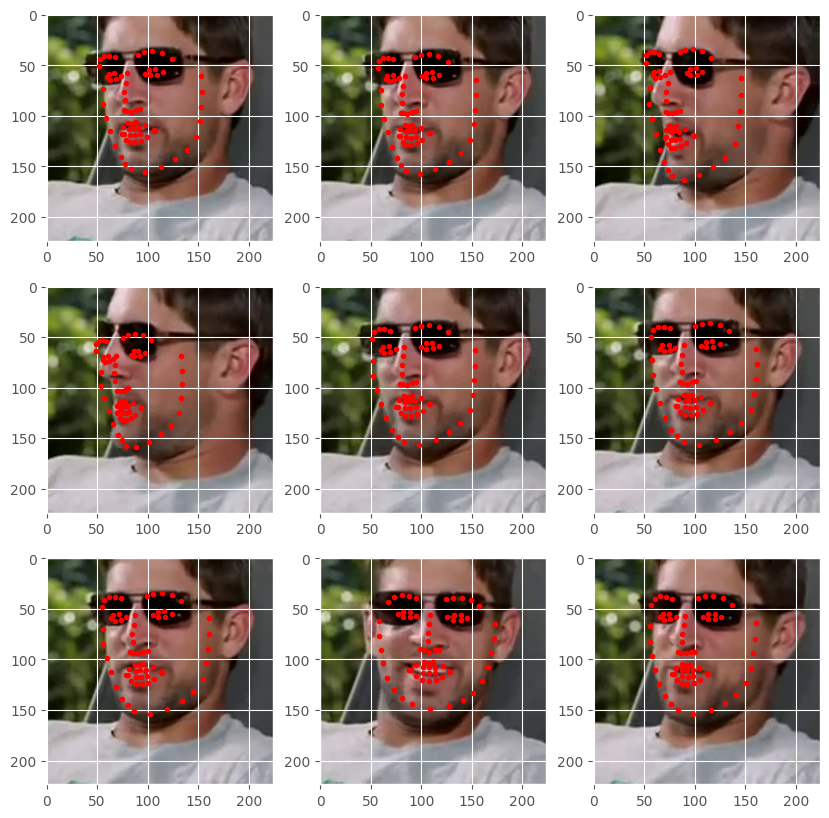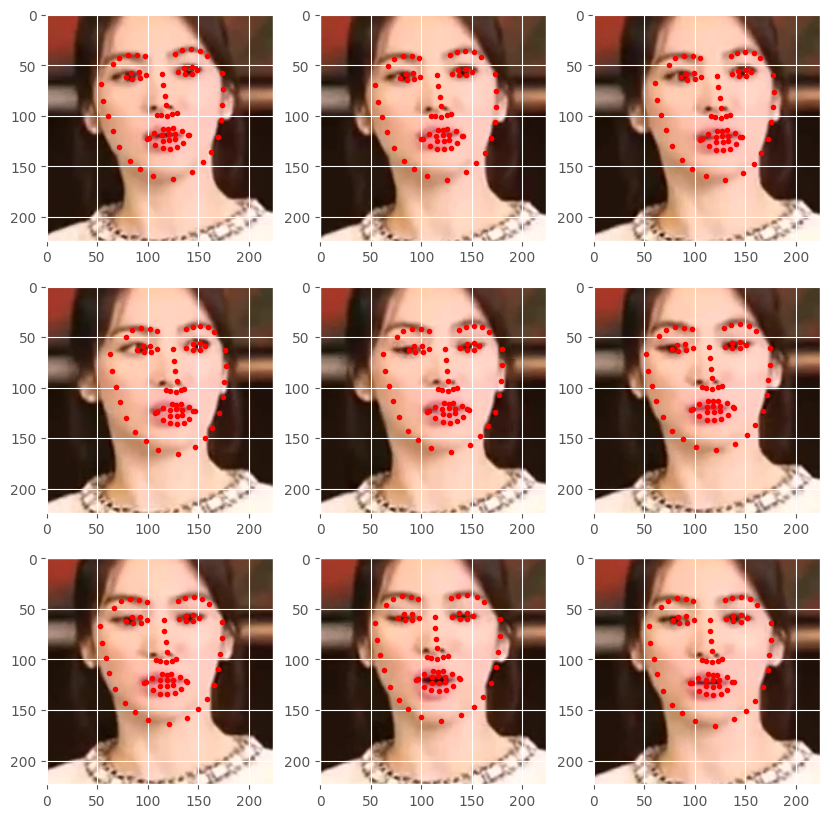

In [1]:
!pip install pretrainedmodels
!pip install albumentations==1.1.0
!pip install cloud-tpu-client==0.10 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.9-cp37-cp37m-linux_x86_64.whl
!pip install torch_xla
!pip install --upgrade opencv-python



# imports the torch_xla package
# import torch_xla
# import torch_xla.core.xla_model as xm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 68.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 47.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 86.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 27.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.8.0.76
    Uninstalling opencv-python-4.8.0.76:
      Successfully uninstalled opencv-python-4.8.0.76


KeyboardInterrupt: 

In [17]:
import pretrainedmodels
import albumentations as A

In [31]:

import torch
# constant paths
ROOT_PATH = 'drive/MyDrive/Diploma_Bachalor/Code/KPD2_dataset'
# learning parameters
BATCH_SIZE = 32
USE_IMAGE_CENTER = False
FACE_CROP = 150
LR = 0.0001
EPOCHS = 30
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# DEVICE = xm.xla_device()
# train/test split
TEST_SPLIT = 0.1
# show dataset keypoint plot
SHOW_DATASET_PLOT = True


In [5]:
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pandas as pd
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from tqdm.notebook import tqdm
plt.style.use('ggplot')

In [6]:
def plot_one_image(image, keypoint):
    """
    This function plots the regressed (predicted) keypoints and the actual
    keypoints after each validation epoch for one image in the batch.
    """
    # detach the image, keypoints, and output tensors from GPU to CPU
    # just get a single datapoint from each batch
    img = np.array(image, dtype='float32')
    img = np.transpose(img, (1, 2, 0))
    plt.imshow(img)

    keypoint = keypoint.reshape(-1, 2)
    for p in range(keypoint.shape[0]):
        plt.plot(keypoint[p, 0], keypoint[p, 1], 'r.')
    plt.show()
    plt.close()

In [7]:
def valid_keypoints_plot(image, outputs, orig_keypoints, epoch):
    """
    This function plots the regressed (predicted) keypoints and the actual
    keypoints after each validation epoch for one image in the batch.
    """
    # detach the image, keypoints, and output tensors from GPU to CPU
    image = image.detach().cpu()
    outputs = outputs.detach().cpu().numpy()
    orig_keypoints = orig_keypoints.detach().cpu().numpy()
    # just get a single datapoint from each batch
    img = image[0]
    output_keypoint = outputs[0]
    orig_keypoint = orig_keypoints[0]
    img = np.array(img, dtype='float32')
    img = np.transpose(img, (1, 2, 0))
    plt.imshow(img)

    output_keypoint = output_keypoint.reshape(-1, 2)
    orig_keypoint = orig_keypoint.reshape(-1, 2)
    for p in range(output_keypoint.shape[0]):
        plt.plot(output_keypoint[p, 0], output_keypoint[p, 1], 'r.')
        plt.plot(orig_keypoint[p, 0], orig_keypoint[p, 1], 'b.')
    plt.show()
    plt.close()

In [8]:
def dataset_keypoints_plot(data):
    """
    This function shows the image faces and keypoint plots that the model
    will actually see. This is a good way to validate that our dataset is in
    fact corrent and the faces align wiht the keypoint features. The plot
    will be show just before training starts. Press `q` to quit the plot and
    start training.
    """
    plt.figure(figsize=(10, 10))
    for i in range(9):
        sample = data[i]
        img = sample['image']
        img = np.array(img, dtype='float32')
        img = np.transpose(img, (1, 2, 0))
        plt.subplot(3, 3, i+1)
        plt.imshow(img)
        keypoints = sample['keypoints']
        for j in range(len(keypoints)):
            plt.plot(keypoints[j, 0], keypoints[j, 1], 'b.')
    plt.show()
    plt.close()

In [9]:
def train_test_split(csv_path, split):
    df_data = pd.read_csv(csv_path)
    len_data = len(df_data)
    # calculate the validation data sample length
    valid_split = int(len_data * split)
    # calculate the training data samples length
    train_split = int(len_data - valid_split)
    training_samples = df_data.iloc[:train_split][:]
    valid_samples = df_data.iloc[-valid_split:][:]
    return training_samples, valid_samples

In [18]:
transform = A.Compose([
    A.Rotate(limit=(-35, 35), p=0.8),
    A.RandomCrop(width=190, height=190, p=0.8),
    A.RandomBrightnessContrast(brightness_limit=0.4, contrast_limit=0.4, p=0.8),
    A.GaussianBlur(blur_limit=(3, 7), p=0.2)
], keypoint_params=A.KeypointParams(format='xy', remove_invisible=False))


In [11]:
class FaceKeypointDataset(Dataset):
    def __init__(self, samples, path, transform=True):
        self.data = samples
        self.path = path
        self.resize = 224
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        image = cv2.imread(f"{self.path}/{self.data.iloc[index][0]}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        orig_h, orig_w, channels = image.shape
        # resize the image into `resize` defined above
        image = cv2.resize(image, (self.resize, self.resize))
        # reshape the keypoints
        keypoints = self.data.iloc[index][1:]
        keypoints = np.array(keypoints, dtype='float32')
        nose_indices = [27, 28, 29, 30, 31, 32, 33, 34, 35]
        nose_indice = [30]
        # indices_to_select = [54, 60, 57, 50, 30, 26, 21, 22, 17]
        keypoints = keypoints.reshape(-1, 2)
        # rescale keypoints according to image resize
        keypoints = keypoints * [self.resize / orig_w, self.resize / orig_h]


        # transform
        if self.transform and np.all(np.array(keypoints) > 0):
            data = transform(image=image, keypoints=keypoints)
            new_image, new_keypoints = data['image'], data['keypoints']
            # reshape again
            new_h, new_w, channel = new_image.shape
            new_image = cv2.resize(new_image, (self.resize, self.resize))
            new_keypoints = np.array(new_keypoints, dtype='float32')
            new_keypoints = new_keypoints * [self.resize / new_w, self.resize / new_h]
            # check for correct keypoints amount
            if len(new_keypoints) == 9:
                keypoints = new_keypoints
                image = new_image
            else:
                keypoints = keypoints
                image = image

        if USE_IMAGE_CENTER:
            nose_x, nose_y = keypoints[nose_indice][0]
            center_shift_x, center_shift_y = self.resize / 2 - nose_x, self.resize / 2 - nose_y
            pad_amount = int(max(abs(center_shift_x), abs(center_shift_y)))
            pil_image = T.functional.to_pil_image(image)
            pad_image = T.functional.pad(pil_image, [pad_amount])
            crop_image = T.functional.crop(pad_image,
                                           pad_amount - center_shift_y, pad_amount - center_shift_x,
                                           self.resize, self.resize)
            new_keypoints = keypoints + [center_shift_x, center_shift_y]

            # whether to crop face
            # image_shift = (self.resize - FACE_CROP) / 2
            # crop_face = T.functional.crop(crop_image,
            #                               image_shift, image_shift,
            #                               FACE_CROP, FACE_CROP)
            # new_keypoints = keypoints * [self.resize / FACE_CROP, self.resize / FACE_CROP] - [image_shift, image_shift]

            keypoints = new_keypoints
            image = cv2.resize(np.array(crop_image), (self.resize, self.resize))


        # again reshape to add grayscale channel format
        image = image / 255.0
        # transpose for getting the channel size to index 0
        image = np.transpose(image, (2, 0, 1))
        if image.shape != (3, 224, 224):
            print('Error: not correct shape ' + str(image.shape))
        if keypoints.shape != (68, 2):
            print('Error: not correct shape ' + str(keypoints.shape))
        return {
            'image': torch.tensor(image, dtype=torch.float),
            'keypoints': torch.tensor(keypoints, dtype=torch.float),
        }

In [13]:
# get the training and validation data samples
training_samples, valid_samples = train_test_split(f"{ROOT_PATH}/training_frames_keypoints.csv",
                                                   TEST_SPLIT)

In [14]:
# initialize the dataset - `FaceKeypointDataset()`
train_data = FaceKeypointDataset(training_samples,
                                 f"{ROOT_PATH}/training",
                                 transform=True)
valid_data = FaceKeypointDataset(valid_samples,
                                 f"{ROOT_PATH}/training",
                                 transform=False)
# prepare data loaders
train_loader = DataLoader(train_data,
                          batch_size=BATCH_SIZE,
                          shuffle=True)
valid_loader = DataLoader(valid_data,
                          batch_size=BATCH_SIZE,
                          shuffle=False)
print(f"Training sample instances: {len(train_data)}")
print(f"Validation sample instances: {len(valid_data)}")

Training sample instances: 3116
Validation sample instances: 346


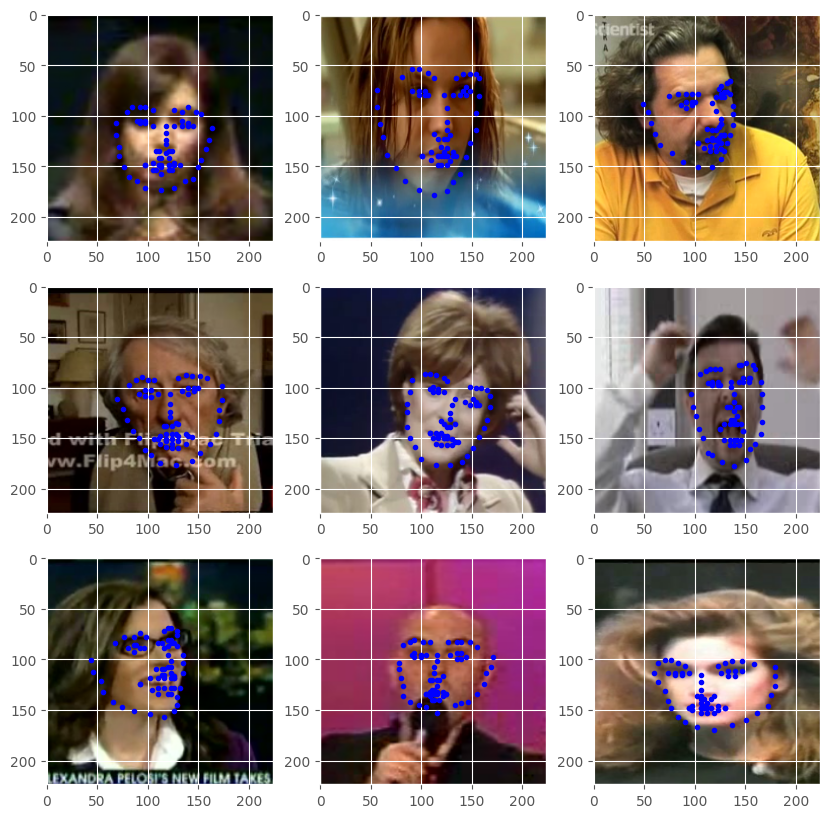

In [15]:
# whether to show dataset keypoint plots
if SHOW_DATASET_PLOT:
    dataset_keypoints_plot(valid_data)

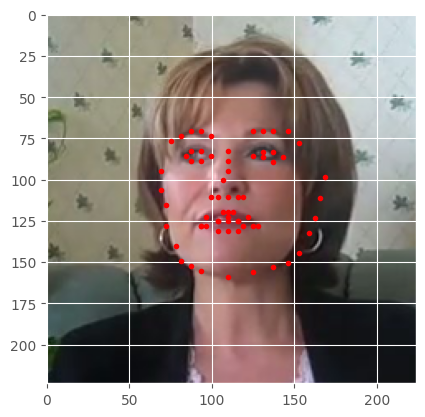

(224, 224, 3)
(190, 190, 3) 68


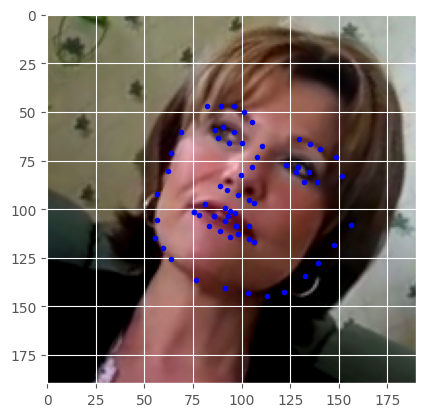

In [19]:
data = train_data[23]
image, keypoints = data['image'].detach().cpu().numpy(), data['keypoints'].detach().cpu().numpy()
plot_one_image(image, keypoints)
image = np.transpose(image, (1, 2, 0))
print(image.shape)
a = transform(image=np.array(image), keypoints=data['keypoints'])
image = np.transpose(image, (2, 0, 1))
print(a['image'].shape, len(a['keypoints']))
plt.imshow(a['image'])
for point in a['keypoints']:
    plt.plot(point[0], point[1], 'b.')
# plot_one_image(a['image'], a['keypoints'])

In [20]:
class FaceKeypointResNet50(nn.Module):
    def __init__(self, pretrained, requires_grad):
        super(FaceKeypointResNet50, self).__init__()
        if pretrained == True:
            self.model = pretrainedmodels.__dict__['resnet50'](pretrained='imagenet')
        else:
            self.model = pretrainedmodels.__dict__['resnet50'](pretrained=None)
        if requires_grad == True:
            for param in self.model.parameters():
                param.requires_grad = True
            print('Training intermediate layer parameters...')
        elif requires_grad == False:
            for param in self.model.parameters():
                param.requires_grad = False
            print('Freezing intermediate layer parameters...')
        # change the final layer
        self.l0 = nn.Linear(2048, 18)
    def forward(self, x):
        # get the batch size only, ignore (c, h, w)
        batch, _, _, _ = x.shape
        x = self.model.features(x)
        x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
        l0 = self.l0(x)
        return l0

In [21]:
class FaceKeypointResNet152(nn.Module):
    def __init__(self, pretrained, requires_grad):
        super(FaceKeypointResNet152, self).__init__()
        if pretrained == True:
            self.model = pretrainedmodels.__dict__['resnet152'](pretrained='imagenet')
        else:
            self.model = pretrainedmodels.__dict__['resnet152'](pretrained=None)
        if requires_grad == True:
            for param in self.model.parameters():
                param.requires_grad = True
            print('Training intermediate layer parameters...')
        elif requires_grad == False:
            for param in self.model.parameters():
                param.requires_grad = False
            print('Freezing intermediate layer parameters...')
        # change the final layer
        self.l0 = nn.Linear(2048, 136)
    def forward(self, x):
        # get the batch size only, ignore (c, h, w)
        batch, _, _, _ = x.shape
        x = self.model.features(x)
        x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
        l0 = self.l0(x)
        return l0

In [22]:
# model
model = FaceKeypointResNet152(pretrained=True, requires_grad=True).to(DEVICE)
# optimizer
optimizer = optim.Adam(model.parameters(), lr=LR)
# we need a loss function which is good for regression like SmmothL1Loss ...
# ... or MSELoss
criterion = nn.SmoothL1Loss()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/hub/checkpoints/resnet152-b121ed2d.pth
100%|██████████| 230M/230M [00:13<00:00, 18.3MB/s]


Training intermediate layer parameters...


In [23]:
from torchsummary import summary

summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [38]:
# training function
def fit(model, dataloader, data):
    print('Training')
    model.train()
    train_running_loss = 0.0
    counter = 0
    # calculate the number of batches
    num_batches = int(len(data)/dataloader.batch_size)
    for i, data in tqdm(enumerate(dataloader), total=num_batches):
        counter += 1
        image, keypoints = data['image'].to(DEVICE), data['keypoints'].to(DEVICE)
        # flatten the keypoints
        keypoints = keypoints.view(keypoints.size(0), -1)
        optimizer.zero_grad()
        outputs = model(image)
        loss = criterion(outputs, keypoints)
        train_running_loss += loss.item()
        loss.backward()
        optimizer.step()

    train_loss = train_running_loss/counter
    return train_loss

In [39]:
# validatioon function
def validate(model, dataloader, data, epoch):
    print('Validating')
    model.eval()
    valid_running_loss = 0.0
    counter = 0
    # calculate the number of batches
    num_batches = int(len(data)/dataloader.batch_size)
    with torch.no_grad():
        for i, data in tqdm(enumerate(dataloader), total=num_batches):
            counter += 1
            image, keypoints = data['image'].to(DEVICE), data['keypoints'].to(DEVICE)
            # flatten the keypoints
            keypoints = keypoints.view(keypoints.size(0), -1)
            outputs = model(image)
            loss = criterion(outputs, keypoints)
            valid_running_loss += loss.item()
            # plot the predicted validation keypoints after every...
            # ... predefined number of epochs
            if (epoch+1) % 1 == 0 and i == 0:
                valid_keypoints_plot(image, outputs, keypoints, epoch)

    valid_loss = valid_running_loss/counter
    return valid_loss

5e-05
Epoch 1 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

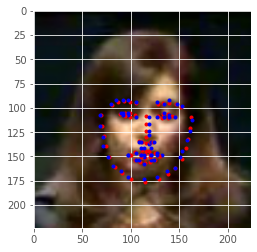

NEW BEST PARAMS
Train Loss: 1.3050
Val Loss: 1.4532
Epoch 2 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

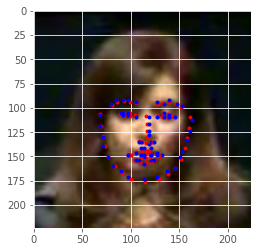

Train Loss: 1.3022
Val Loss: 1.4598
Epoch 3 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

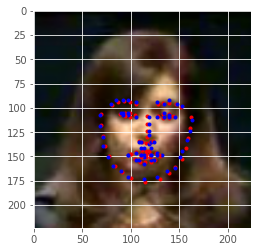

Train Loss: 1.3149
Val Loss: 1.4653
Epoch 4 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

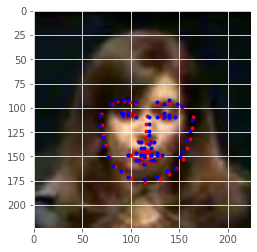

Train Loss: 1.3116
Val Loss: 1.4852
Epoch 5 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

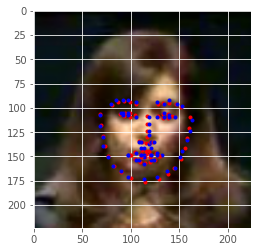

Train Loss: 1.3056
Val Loss: 1.4800
Epoch 6 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

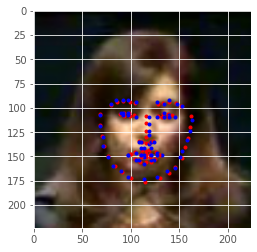

Train Loss: 1.3165
Val Loss: 1.5148
Epoch 7 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

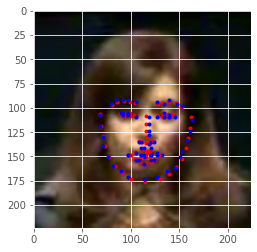

Train Loss: 1.3364
Val Loss: 1.4611
Epoch 8 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

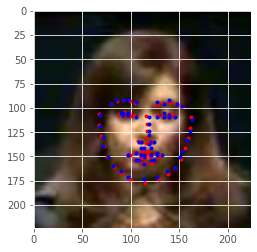

Train Loss: 1.2908
Val Loss: 1.4975
Epoch 9 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

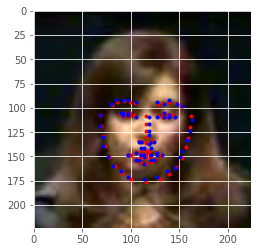

Train Loss: 1.3285
Val Loss: 1.4570
Epoch 10 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

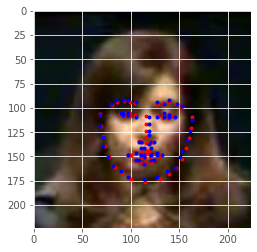

Train Loss: 1.3102
Val Loss: 1.4662
Epoch 11 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

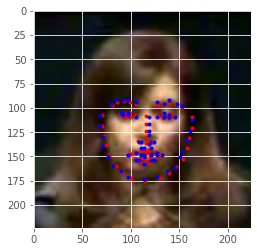

Train Loss: 1.3222
Val Loss: 1.4799
Epoch 12 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

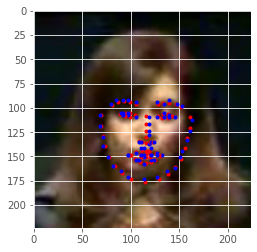

Train Loss: 1.2878
Val Loss: 1.4552
Epoch 13 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

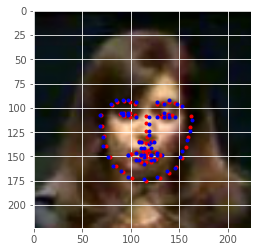

Train Loss: 1.3226
Val Loss: 1.4837
Epoch 14 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

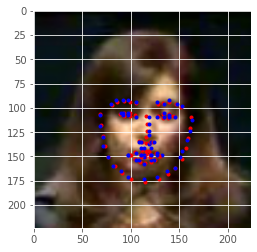

Train Loss: 1.2895
Val Loss: 1.4608
Epoch 15 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

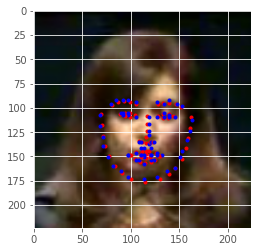

NEW BEST PARAMS
Train Loss: 1.2991
Val Loss: 1.4371
Epoch 16 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

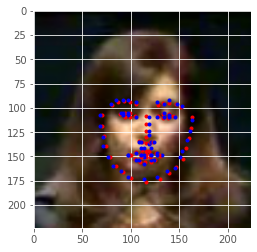

Train Loss: 1.2926
Val Loss: 1.4505
Epoch 17 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

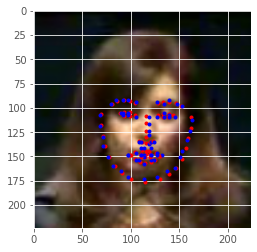

Train Loss: 1.3126
Val Loss: 1.4881
Epoch 18 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

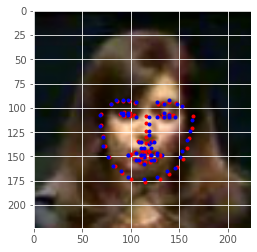

Train Loss: 1.3102
Val Loss: 1.5140
Epoch 19 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

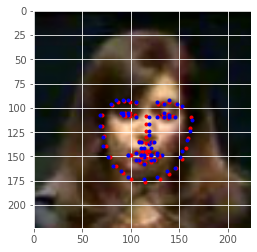

NEW BEST PARAMS
Train Loss: 1.2930
Val Loss: 1.4297
Epoch 20 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

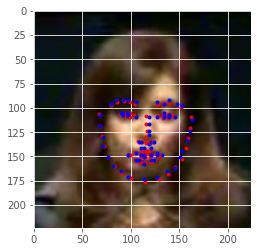

Train Loss: 1.3180
Val Loss: 1.4922
Epoch 21 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

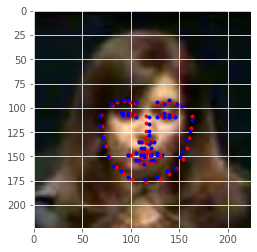

Train Loss: 1.3114
Val Loss: 1.4587
Epoch 22 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

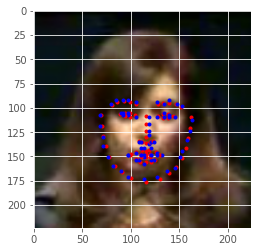

Train Loss: 1.3038
Val Loss: 1.4558
Epoch 23 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

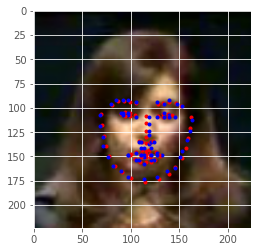

Train Loss: 1.2890
Val Loss: 1.4710
Epoch 24 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

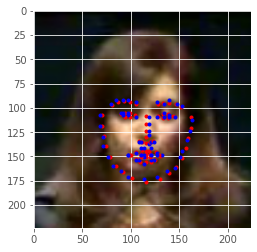

Train Loss: 1.2960
Val Loss: 1.4598
Epoch 25 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

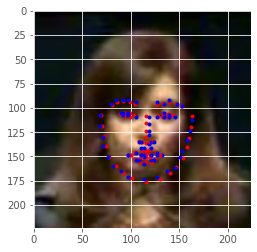

Train Loss: 1.3086
Val Loss: 1.4837
Epoch 26 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

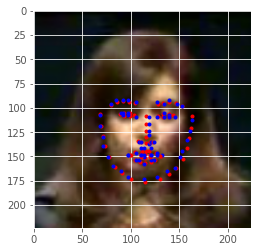

Train Loss: 1.3181
Val Loss: 1.4627
Epoch 27 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

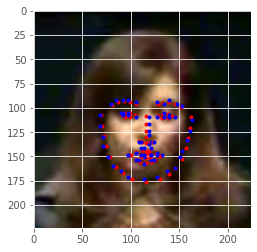

Train Loss: 1.3163
Val Loss: 1.4312
Epoch 28 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

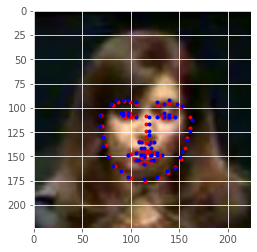

Train Loss: 1.3063
Val Loss: 1.4962
Epoch 29 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

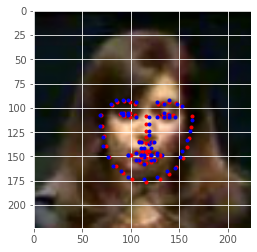

Train Loss: 1.3171
Val Loss: 1.4391
Epoch 30 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

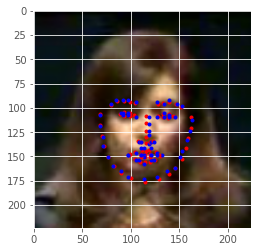

Train Loss: 1.3073
Val Loss: 1.5262
Epoch 31 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

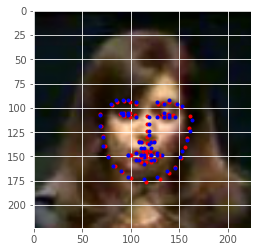

Train Loss: 1.2883
Val Loss: 1.4519
Epoch 32 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

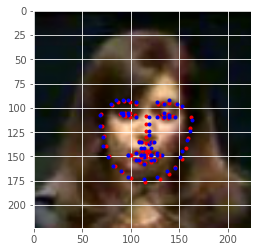

Train Loss: 1.3165
Val Loss: 1.4400
Epoch 33 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

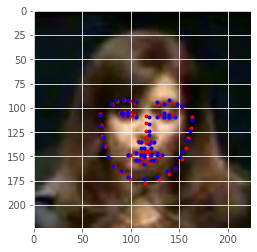

Train Loss: 1.2923
Val Loss: 1.4950
Epoch 34 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

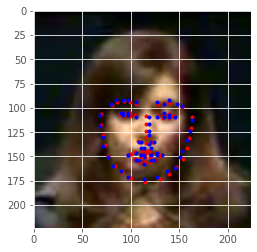

Train Loss: 1.2967
Val Loss: 1.4806
Epoch 35 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

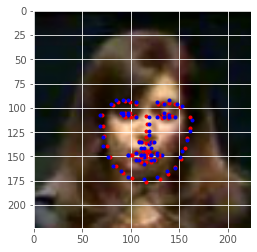

Train Loss: 1.2845
Val Loss: 1.4391
Epoch 36 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

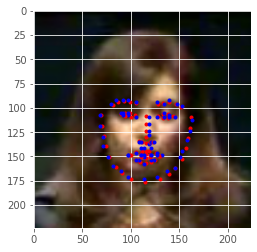

Train Loss: 1.3113
Val Loss: 1.4369
Epoch 37 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

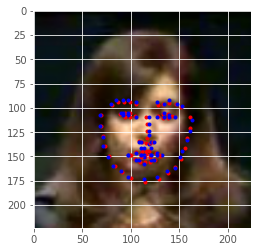

Train Loss: 1.3249
Val Loss: 1.4668
Epoch 38 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

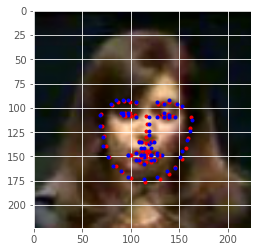

Train Loss: 1.3271
Val Loss: 1.4519
Epoch 39 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

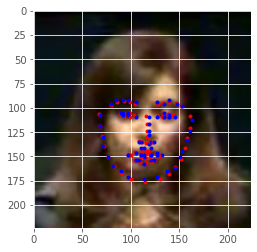

Train Loss: 1.2976
Val Loss: 1.4619
Epoch 40 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

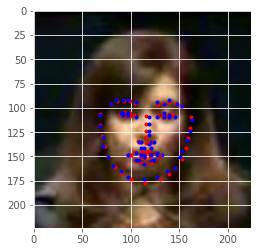

Train Loss: 1.3172
Val Loss: 1.4749
Epoch 41 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

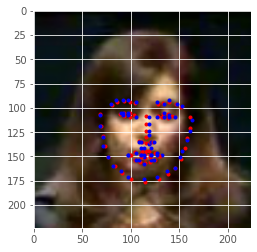

Train Loss: 1.2973
Val Loss: 1.4736
Epoch 42 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

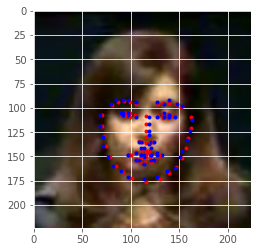

Train Loss: 1.3259
Val Loss: 1.4529
Epoch 43 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

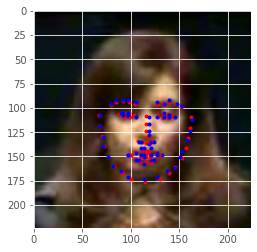

Train Loss: 1.3036
Val Loss: 1.4936
Epoch 44 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

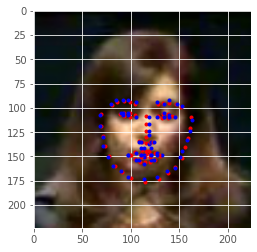

Train Loss: 1.3280
Val Loss: 1.4555
Epoch 45 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

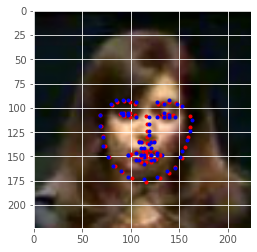

Train Loss: 1.3067
Val Loss: 1.4596
Epoch 46 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

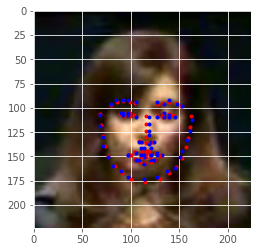

Train Loss: 1.3006
Val Loss: 1.4797
Epoch 47 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

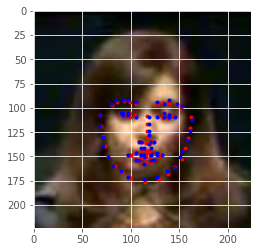

Train Loss: 1.3315
Val Loss: 1.4554
Epoch 48 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

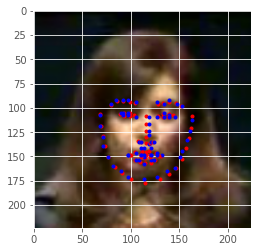

Train Loss: 1.2916
Val Loss: 1.4603
Epoch 49 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

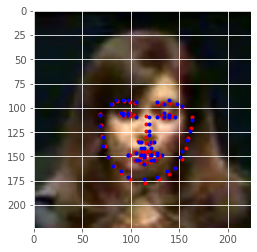

Train Loss: 1.3314
Val Loss: 1.5054
Epoch 50 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

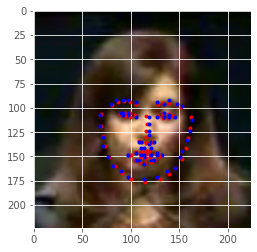

Train Loss: 1.2979
Val Loss: 1.4327
Epoch 51 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

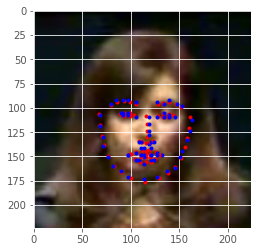

Train Loss: 1.3074
Val Loss: 1.4989
Epoch 52 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

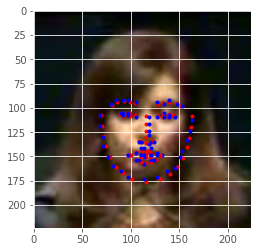

Train Loss: 1.3325
Val Loss: 1.4314
Epoch 53 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

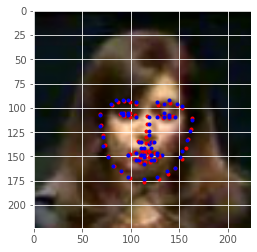

Train Loss: 1.3206
Val Loss: 1.5042
Epoch 54 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

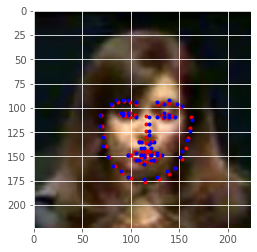

Train Loss: 1.3073
Val Loss: 1.4787
Epoch 55 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

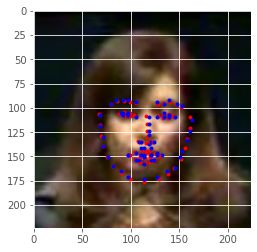

Train Loss: 1.3831
Val Loss: 1.5296
Epoch 56 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

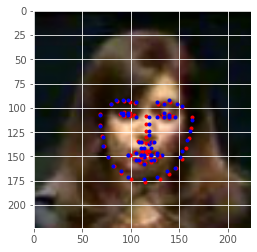

Train Loss: 1.3345
Val Loss: 1.4713
Epoch 57 of 200
Training


  0%|          | 0/97 [00:00<?, ?it/s]

In [ ]:
train_loss = []
val_loss = []
EPOCHS = 200
BEST_VAL_LOSS = 5
LR = 0.00005
print(LR)
# model = load_model(path=f"best_face_model.pth")
for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1} of {EPOCHS}")
    train_epoch_loss = fit(model, train_loader, train_data)
    val_epoch_loss = validate(model, valid_loader, valid_data, epoch)
    train_loss.append(train_epoch_loss)
    val_loss.append(val_epoch_loss)
    if val_epoch_loss < BEST_VAL_LOSS:
        BEST_VAL_LOSS = val_epoch_loss
        print('NEW BEST PARAMS')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': criterion,
            }, f"{ROOT_PATH}/model/model_best_resnet152_p-68_lr-{LR}.pth")
    print(f"Train Loss: {train_epoch_loss:.4f}")
    print(f'Val Loss: {val_epoch_loss:.4f}')

In [ ]:
# loss plots
plt.figure(figsize=(10, 7))
plt.plot(train_loss, color='orange', label='train loss')
plt.plot(val_loss, color='red', label='validataion loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
print('DONE TRAINING')

In [24]:
class NoseKeypointResNet152(nn.Module):
    def __init__(self, pretrained, requires_grad):
        super(NoseKeypointResNet152, self).__init__()
        if pretrained == True:
            self.model = pretrainedmodels.__dict__['resnet152'](pretrained='imagenet')
        else:
            self.model = pretrainedmodels.__dict__['resnet152'](pretrained=None)
        if requires_grad == True:
            for param in self.model.parameters():
                param.requires_grad = True
            print('Training intermediate layer parameters...')
        elif requires_grad == False:
            for param in self.model.parameters():
                param.requires_grad = False
            print('Freezing intermediate layer parameters...')
        # change the final layer
        self.l0 = nn.Linear(2048, 2)
    def forward(self, x):
        # get the batch size only, ignore (c, h, w)
        batch, _, _, _ = x.shape
        x = self.model.features(x)
        x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
        l0 = self.l0(x)
        return l0

In [25]:
def load_model(path, is_nose=False):
    full_path = f'{ROOT_PATH}/model/{path}'
    if is_nose:
        model = NoseKeypointResNet152(pretrained=True, requires_grad=False).to(DEVICE)
    else:
        model = FaceKeypointResNet152(pretrained=True, requires_grad=False).to(DEVICE)
    # load the model checkpoint
    print(full_path)
    checkpoint = torch.load(full_path)
    # load model weights state_dict
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    return model

In [26]:
nose_model = load_model(path=f'_best_model_best_resnet152_p-68_lr-5e-05_nose.pth', is_nose=True)

Freezing intermediate layer parameters...
drive/MyDrive/Diploma_Bachalor/Code/KPD2_dataset/model/_best_model_best_resnet152_p-68_lr-5e-05_nose.pth


In [40]:
model = load_model(path=f"model_best_resnet152_p-68_lr-{LR}.pth")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Freezing intermediate layer parameters...
drive/MyDrive/Diploma_Bachalor/Code/KPD2_dataset/model/model_best_resnet152_p-68_lr-0.0001.pth


In [27]:
!pip install pydub
from pydub import AudioSegment

In [57]:
data_path = 'drive/MyDrive/Diploma_Bachalor/Code/KPD/'
video_path = data_path + '00056.mp4'

In [58]:
vidcap = cv2.VideoCapture(video_path)
success,image = vidcap.read()
count = 0
success = True
frames = []
while success:
    frames.append(image)
    # cv2.imwrite("frame%d.jpg" % count, image)     # save frame as JPEG file if you want
    success,image = vidcap.read()
    # print('Read a new frame: ', success)
    count += 1
print(count, " frames extracted")
frames = np.array(frames)
print("data shape =\t", frames.shape)

def rgb2gray(rgb):
        return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

134  frames extracted
data shape =	 (134, 224, 224, 3)


In [59]:
# read the test CSV file
csv_file = f"{data_path}/test.csv"
data = pd.read_csv(csv_file)
pixel_col = data.Image
image_pixels = []
for i in tqdm(range(len(pixel_col))):
    img = pixel_col[i].split(' ')
    image_pixels.append(img)
# convert to NumPy array
images = np.array(image_pixels, dtype='float32')

  0%|          | 0/1783 [00:00<?, ?it/s]

In [60]:
def transform_image(image):
    image = np.array(image)
    image = np.transpose(image, (2, 0, 1))
    c, w, h = image.shape

    torch_image = image / 255.0
    torch_image = torch.tensor(torch_image, dtype=torch.float)
    torch_image = torch_image.unsqueeze(0).to(DEVICE)

    nose_x, nose_y = nose_model(torch_image).cpu().numpy()[0]
    center_shift_x, center_shift_y = h / 2 - nose_x, w / 2 - nose_y
    pad_amount = int(max(abs(center_shift_x), abs(center_shift_y)))

    image = np.transpose(image, (1, 2, 0))

    pil_image = T.functional.to_pil_image(image)
    pad_image = T.functional.pad(pil_image, [pad_amount])
    crop_image = T.functional.crop(pad_image,
                                    int(pad_amount - center_shift_y), int(pad_amount - center_shift_x),
                                    int(w), int(h))

    # whether to crop face
    # image_shift = (self.resize - FACE_CROP) / 2
    # crop_face = T.functional.crop(crop_image,
    #                               image_shift, image_shift,
    #                               FACE_CROP, FACE_CROP)
    # new_keypoints = keypoints * [self.resize / FACE_CROP, self.resize / FACE_CROP] - [image_shift, image_shift]

    return cv2.resize(np.array(crop_image), (h, w)), (center_shift_x, center_shift_y)

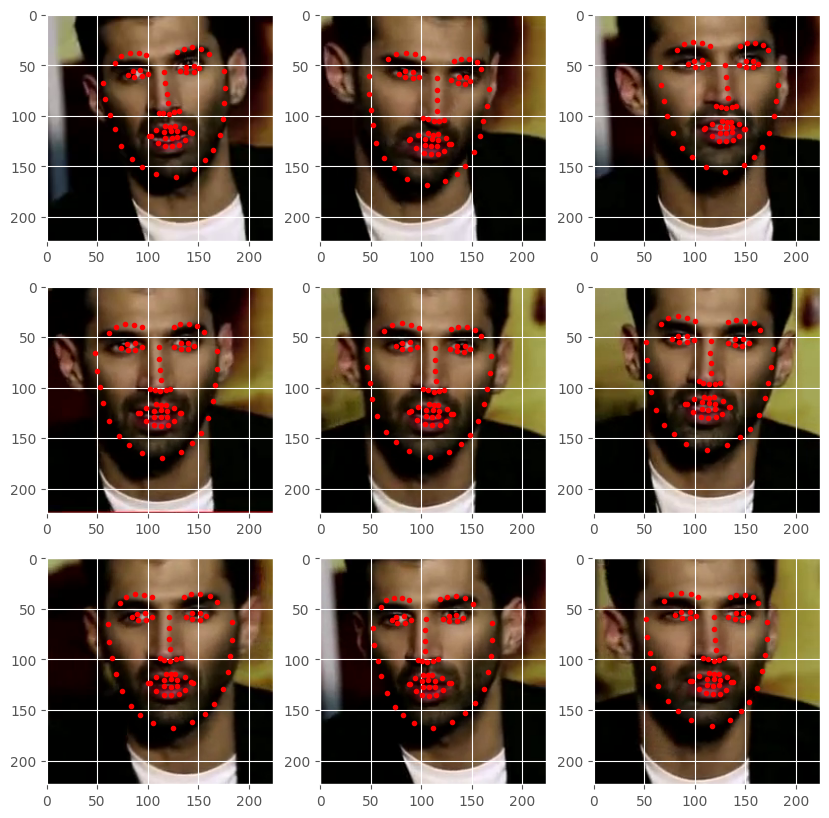

In [61]:
images_list, outputs_list = [], []
plt.figure(figsize=(10, 10))
for i in range(9):
    with torch.no_grad():
        img = frames[i * 10]
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        orig_h, orig_w, channel = img.shape
        # resize the image into `resize` defined above
        image = cv2.resize(img, (224, 224))

        # transform image
        shift_vector = None

        if True:
            new_image, shift_vector = transform_image(image)
            image = new_image

        # again reshape to add grayscale channel format
        image = image / 255.0
        # transpose for getting the channel size to index 0
        torch_image = np.transpose(image, (2, 0, 1))

        # forward pass through the model
        torch_image = torch.tensor(torch_image, dtype=torch.float)
        torch_image = torch_image.unsqueeze(0).to(DEVICE)
        outputs = model(torch_image)
        outputs = outputs.to('cpu')
        outputs = outputs.reshape(-1, 2)


        # append the current original image
        plt.subplot(3, 3, i+1)

        plt.imshow(img)
        keypoints = outputs.numpy()
        # update keypoints positions
        if True:
            keypoints = keypoints - shift_vector
        for points in keypoints:

            plt.plot(points[0], points[1], 'r.')